# **Parallel Parking Detection using Computer Vision and Convolutional Neural Nets**

# **Project Goals:**
## The main objective of the proposed system is to find parallel parking spaces along with regular parking spots which is a major challenge that most people and autonomous vehicles are facing today.

# **Source of Data and Implementation**
### Data: The source of data for this project will be a real-time video of any parking lot that has both perpendicular or parallel parking scenarios. The Data would be generated from the video for each frame using OpenCV ( a computer vision library).

### The dataset used for detecting the cars in the image or any object in the parking space would be COCO (Common Object in Context) https://cocodataset.org/#home



### **Implementation**: 
### The generated data is then fed to the CNN model which is used to detect objects like cars in each frame. Use of Mask -RCNN for detecting parking spaces vacant or not using object detection models like COCO or YOLO datasets.

### Implement a RCNN with Mask to detect objects like cars in the input video stream that is fed to the model as each frame.

### Detect the bounding box of the parking spot and classify them as Available or not available.

### Use OpenCV library to convert video into frames.

### Use TensorFlow to create Deep CNN architecture and use the pre-trained model to compare the accuracy of parking space detection.

### Use Python external messaging service/API to send a text message to the driver if space is available.

### **COCO dataset description:**

### Created by Microsoft.

### COCO is large-scale object detection, segmentation, and captioning dataset.

### It has 330K images where 200K images are pre-labeled.

### 1.5 million object instances.

### 80 object categories.

### **Phase 1 and 2. Data Exploration and Pre-Process Custom Data to train MaskRCNN model for object detection.**
In the application parking detection, we have to acheive two tasks.
1. Object Detection Like Cars, Trucks and Persons
2. Parking space Detection.

### Install COCO tools

In [ ]:
!pip install git+https://github.com/philferriere/cocoapi.git

# Most of the files required to this project is retrieved from the google drive.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow
print(tensorflow.__version__)

2.4.1


In [3]:
!ls

drive  sample_data


In [4]:
import os
os.chdir("/content/drive/My Drive/Parking_Detection_Capstone/Mask_RCNN/")

In [5]:
import numpy
import cv2
import mrcnn.config
import mrcnn.utils
from mrcnn.model import MaskRCNN
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from matplotlib import pyplot
import imgaug

In [6]:
tensorflow.device('/GPU:0')

In [7]:
!ls

 assets		     setup.py
 images		    'training config20210331T0552'
 LICENSE	    'training config20210331T1447'
 MANIFEST.in	    'training config20210331T1718'
 mask_rcnn_coco.h5  'training config20210401T0447'
 mrcnn		    'training config20210401T0517'
 README.md	    'training config20210401T0519'
 requirements.txt   'training config20210401T0529'
 samples	    'training config20210401T0532'
 setup.cfg


# Create a config class required to make inference on model for 80 classes. This is the step we need to modify for fine tuning the model.
  1. Inference 
  2. Training

In [8]:
class Mask_RCNN_Configuration(mrcnn.config.Config):
    NAME="coco_pretrained_model_config"
    IMAGES_PER_GPU=1
    GPU_COUNT=1
    NUM_CLASSES=80+1
    DETECTION_MIN_CONFIDENCE=0.6
    BATCH_SIZE=1

In [9]:
config = Mask_RCNN_Configuration()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.6
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [10]:
with tensorflow.device("/GPU:0"):
  model=MaskRCNN(mode='inference',
               model_dir=os.getcwd(),
               config=Mask_RCNN_Configuration())
  model.load_weights('mask_rcnn_coco.h5',by_name=True)

Instructions for updating:
Use fn_output_signature instead


# List of class names

In [11]:
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
                'bus', 'train', 'truck', 'boat', 'traffic light',
                'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
                'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
                'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
                'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
                'kite', 'baseball bat', 'baseball glove', 'skateboard',
                'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
                'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
                'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
                'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
                'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
                'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
                'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
                'teddy bear', 'hair drier', 'toothbrush']

In [12]:
%matplotlib inline
from pycocotools.coco import COCO
import skimage.io as io
import pylab
pylab.rcParams['figure.figsize'] = (8.0, 10.0)

# What are Annotations in Deep Learning?

### Annotation in machine learning / artificial is a process of labelling the data on images. The image may contain humans, vehicles, any objects to make it recognizable for machines. Annotations are of various types and it can used to educate machines about the presence of various objects in the world.

# Loading Training Data from COCO Annotation file.

In [13]:
training_annFile='/content/drive/MyDrive/Parking_Detection_Capstone/instances_train2017.json'
with tensorflow.device('/GPU:0'):
  coco=COCO(training_annFile)

loading annotations into memory...
Done (t=24.26s)
creating index...
index created!


In [14]:
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories: \n{}'.format(' '.join(nms)))

COCO categories: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories: 
food indoor outdoor vehicle accessory sports kitchen furniture appliance electronic animal person


In [15]:
catIds = coco.getCatIds(catNms=['car','truck']);
imgIds = coco.getImgIds(catIds=catIds);
images = coco.loadImgs(imgIds)

# Loading data from Validation Annotation file.

In [16]:
val_annFile='/content/drive/MyDrive/Parking_Detection_Capstone/instances_val2017.json'
with tensorflow.device('/gpu:0'):
  val_coco=COCO(val_annFile)

loading annotations into memory...
Done (t=1.88s)
creating index...
index created!


In [17]:
val_cats = val_coco.loadCats(val_coco.getCatIds())
cat_nms=[cat['name'] for cat in val_cats]
print('COCO categories: \n{}\n'.format(' '.join(cat_nms)))

super_cat_nms = set([cat['supercategory'] for cat in val_cats])
print('COCO supercategories: \n{}'.format(' '.join(super_cat_nms)))

COCO categories: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories: 
food indoor outdoor vehicle accessory sports kitchen furniture appliance electronic animal person


In [18]:
val_catIds = val_coco.getCatIds(catNms=['car','truck']);
val_imgIds = val_coco.getImgIds(catIds=val_catIds);
val_images = val_coco.loadImgs(val_imgIds)

# Display Sample Images.
### **Note**: *I have been loading data from coco-url. This saved me a lot of space and improved training time. Moreover, The COCO dataset has almost 120000 images of size 640*480 width and height of almost 18gb data.*

Total Training Images: 3664
Total Validation  Images: 152
http://images.cocodataset.org/train2017/000000237568.jpg


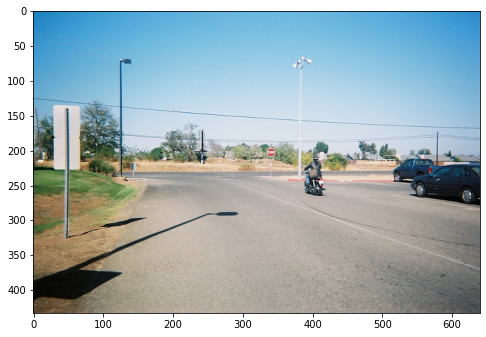

http://images.cocodataset.org/train2017/000000344067.jpg


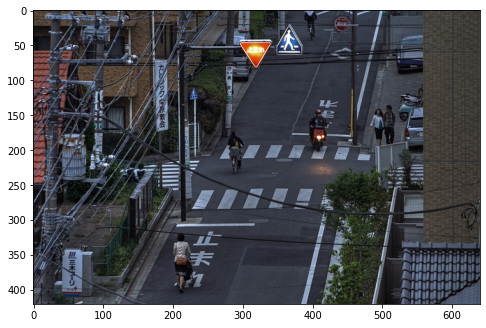

http://images.cocodataset.org/train2017/000000114692.jpg


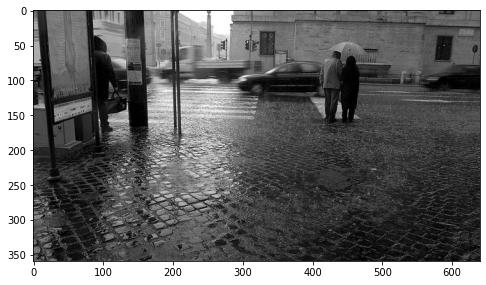

http://images.cocodataset.org/train2017/000000319492.jpg


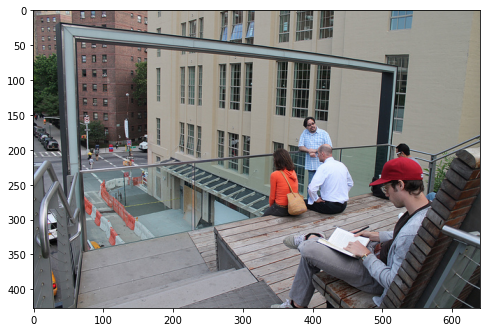

http://images.cocodataset.org/train2017/000000294918.jpg


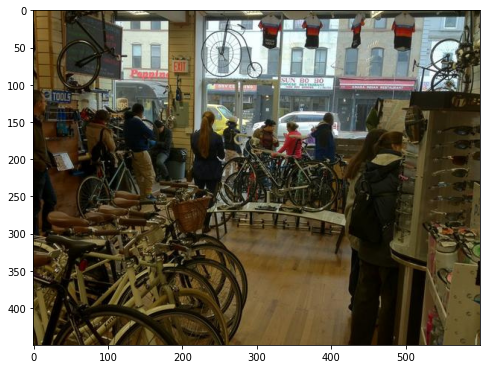

In [19]:
print("Total Training Images: {}".format(len(images)))
print("Total Validation  Images: {}".format(len(val_images)))
for image in range(0,5):
    I = io.imread(images[image]['coco_url'])
    print(images[image]['coco_url'])
    plt.imshow(I)
    plt.show()

Sample Validation Images---------


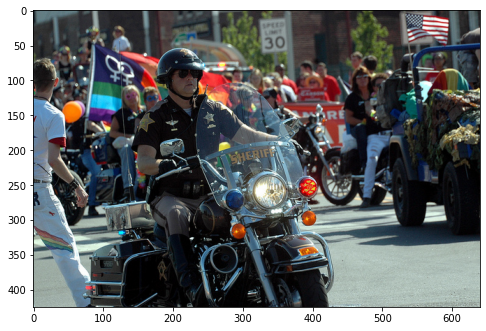

In [20]:
print("Sample Validation Images---------")
img_val = io.imread(val_images[4]['coco_url'])
plt.imshow(img_val)
plt.show()

# Mask R-CNN architecture
Mask R-CNN is a state of the art model for instance segmentation, developed on top of Faster R-CNN. Faster R-CNN is a region-based convolutional neural networks, that returns bounding boxes for each object and its class label with a confidence score.

To understand Mask R-CNN, let's first discus architecture of Faster R-CNN that works in two stages:

Stage1: The first stage consists of two networks, backbone (ResNet, VGG, Inception, etc..) and region proposal network. These networks run once per image to give a set of region proposals. Region proposals are regions in the feature map which contain the object.

Stage2: In the second stage, the network predicts bounding boxes and object class for each of the proposed region obtained in stage1. Each proposed region can be of different size whereas fully connected layers in the networks always require fixed size vector to make predictions. Size of these proposed regions is fixed by using either RoI pool (which is very similar to MaxPooling) or RoIAlign method.

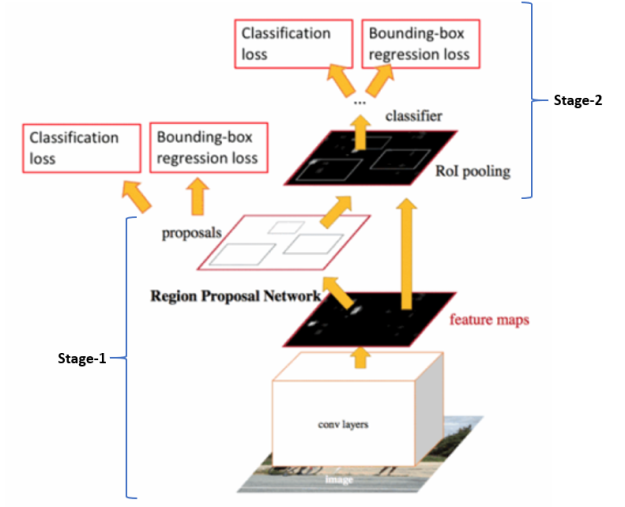

Faster R-CNN predicts object class and bounding boxes. Mask R-CNN is an extension of Faster R-CNN with additional branch for predicting segmentation masks on each Region of Interest (RoI).

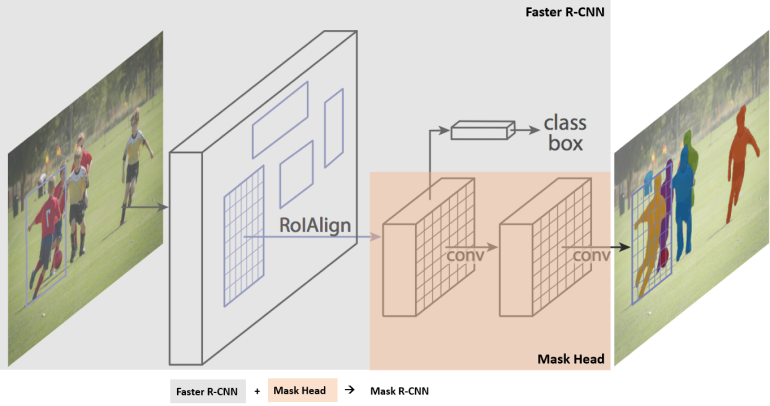

In the second stage of Faster R-CNN, RoI pool is replaced by RoIAlign which helps to preserve spatial information which gets misaligned in case of RoI pool. RoIAlign uses binary interpolation to create a feature map that is of fixed size for e.g. 7 x 7.

The output from RoIAlign layer is then fed into Mask head, which consists of two convolution layers. It generates mask for each RoI, thus segmenting an image in pixel-to-pixel manner.

References: https://developers.arcgis.com/python/guide/how-maskrcnn-works/

# Setting the configuration for training the model.

I am feeding 2 images per GPU. Again it depends on GPU memory. 
I only need 2 classes to train( Car and Truck). +1 is nothing but a background in a image.

In [21]:
class TrainCocoConfig(mrcnn.config.Config):
    NAME = "training config"
    IMAGES_PER_GPU = 2
    NUM_CLASSES = 2+1
    STEPS_PER_EPOCH=150


training_config = TrainCocoConfig()
training_config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [22]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


# Creating a Custom DataSet. This custom dataset needs to have three functions 
1. load_data(): return_coco: If True, returns the COCO object. This will add our specific classes to the data loader class.
2. load_masks(): Load instance masks for the given image. This function converts the different mask format to one format in the form of a bitmap [height, width, instances]. It Returns masks: A bool array of shape [height, width, instance count] with one mask per instance and also returns class_ids: a 1D array of class IDs of the instance masks.
3. image_reference(): Return a link to the image in the COCO Website.

referred from https://towardsdatascience.com/mask-rcnn-implementation-on-a-custom-dataset-fd9a878123d4

In [23]:
from pycocotools import mask as maskUtils
from mrcnn import utils
class CustomCocoDataset(utils.Dataset):
    def load_coco(self,coco_object,categoryList,return_coco=False):
        coco = coco_object
        catIds = coco.getCatIds(catNms=categoryList);
        imgIds = coco.getImgIds(catIds=catIds);
        images = coco.loadImgs(imgIds)
        class_ids = sorted(catIds)
    
        for i in class_ids:
            self.add_class("coco", i, coco.loadCats(i)[0]["name"])
            
        for i in imgIds:
            self.add_image(
                "coco", image_id=i,
                path=coco.imgs[i]['coco_url'],
                width=coco.imgs[i]["width"],
                height=coco.imgs[i]["height"],
                annotations=coco.loadAnns(coco.getAnnIds(
                    imgIds=[i], catIds=class_ids, iscrowd=None)))
        if return_coco:
            return coco
        
    def load_mask(self,image_id):
        image_info = self.image_info[image_id]
        instance_masks = []
        class_ids = []
        annotations = self.image_info[image_id]["annotations"]
        for annotation in annotations:
            class_id = self.map_source_class_id(
                "coco.{}".format(annotation['category_id']))
            if class_id:
                m = self.annToMask(annotation, image_info["height"],
                                   image_info["width"])
                if m.max() < 1:
                    continue
                if annotation['iscrowd']:
                    class_id *= -1
                    if m.shape[0] != image_info["height"] or m.shape[1] != image_info["width"]:
                        m = np.ones([image_info["height"], image_info["width"]], dtype=bool)
                instance_masks.append(m)
                class_ids.append(class_id)
        if class_ids:
            mask = np.stack(instance_masks, axis=2).astype(np.bool)
            class_ids = np.array(class_ids, dtype=np.int32)
            return mask, class_ids
        else:
            return super(CustomCocoDataset, self).load_mask(image_id)
        
    def image_reference(self,image_id):
        info = self.image_info[image_id]
        if info["source"] == "coco":
            return "http://cocodataset.org/#explore?id={}".format(info["id"])
        else:
            super(CustomCocoDataset, self).image_reference(image_id)
            
    def annToRLE(self, ann, height, width):
        segm = ann['segmentation']
        if isinstance(segm, list):
            rles = maskUtils.frPyObjects(segm, height, width)
            rle = maskUtils.merge(rles)
        elif isinstance(segm['counts'], list):
            rle = maskUtils.frPyObjects(segm, height, width)
        else:
            rle = ann['segmentation']
        return rle

    def annToMask(self, ann, height, width):
        rle = self.annToRLE(ann, height, width)
        m = maskUtils.decode(rle)
        return m

# Prepare Data for Model Training.
As you can see that we have images that match category car truck and boat. 

In [24]:
dataset_train = CustomCocoDataset()
dataset_train.load_coco(coco,categoryList=['car','truck','boat'])
dataset_train.prepare()
print('Train: %d' % len(dataset_train.image_ids))

dataset_val = CustomCocoDataset()
dataset_val.load_coco(val_coco,categoryList=['car','truck','boat'])
dataset_val.prepare()
print('Val: %d' % len(dataset_val.image_ids))

Train: 3664
Val: 152


Note: Strongly recommended to use GPU. 
Without GPU, it takes around 1 day to train.


In [ ]:
with tensorflow.device('/GPU:0'):
  train_model=MaskRCNN(mode='training',
               model_dir=os.getcwd(),
               config=training_config)
  model_weights_path="/content/drive/MyDrive/Parking_Detection_Capstone/Mask_RCNN/mask_rcnn_coco.h5"

init_with = "coco"
if init_with=="imagenet":
    train_model.load_weights(model.get_imagenet_weights(),by_name=True)
elif init_with=="coco":
    train_model.load_weights(model_weights_path,by_name=True,exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    train_model.load_weights(model.find_last(), by_name=True)
    
augmentation = imgaug.augmenters.Fliplr(0.5)
    
print("Training network heads")
with tensorflow.device('/GPU:0'):
  train_model.train(dataset_train, dataset_val,
                learning_rate=training_config.LEARNING_RATE,epochs=10,layers='heads',
                augmentation=augmentation)

# print("Fine tune Resnet stage 4 and up")
# with tensorflow.device('/GPU:0'):
#   train_model.train(dataset_train, dataset_val,
#                     learning_rate=training_config.LEARNING_RATE,
#                     epochs=10,
#                     layers='4+',
#                     augmentation=augmentation)
print("Fine tune all layers")
with tensorflow.device('/GPU:0'):
  train_model.train(dataset_train, dataset_val,
                    learning_rate=training_config.LEARNING_RATE / 10,
                    epochs=20,
                    layers='all',
                    augmentation=augmentation)

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: /content/drive/My Drive/Parking_Detection_Capstone/Mask_RCNN/training config20210401T0532/mask_rcnn_training config_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (Time

/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:437: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub:0", shape=(None,), dtype=int32, device=/device:GPU:0), values=Tensor("training/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32, device=/device:GPU:0), dense_shape=Tensor("training/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/Shape:0", shape=(4,), dtype=int32, device=/device:GPU:0))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:437: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub_1:0", shape=(None,), 

150/150 [==============================] - ETA: 0s - batch: 74.5000 - size: 2.0000 - loss: 1.4889 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.4934 - mrcnn_class_loss: 0.2547 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3251WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


150/150 [==============================] - 567s 4s/step - batch: 74.5000 - size: 2.0000 - loss: 1.4889 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.4934 - mrcnn_class_loss: 0.2547 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3251 - val_loss: 1.3347 - val_rpn_class_loss: 0.0516 - val_rpn_bbox_loss: 0.4817 - val_mrcnn_class_loss: 0.2362 - val_mrcnn_bbox_loss: 0.2636 - val_mrcnn_mask_loss: 0.3016
Epoch 2/10
150/150 [==============================] - 367s 2s/step - batch: 74.5000 - size: 2.0000 - loss: 1.2965 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.4828 - mrcnn_class_loss: 0.2253 - mrcnn_bbox_loss: 0.2555 - mrcnn_mask_loss: 0.2935 - val_loss: 1.2793 - val_rpn_class_loss: 0.0413 - val_rpn_bbox_loss: 0.4709 - val_mrcnn_class_loss: 0.2660 - val_mrcnn_bbox_loss: 0.2255 - val_mrcnn_mask_loss: 0.2755
Epoch 3/10
150/150 [==============================] - 432s 3s/step - batch: 74.5000 - size: 2.0000 - loss: 1.0825 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 0.3445 - mrcnn_class_loss: 0.2192 - m

/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:437: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub:0", shape=(None,), dtype=int32, device=/device:GPU:0), values=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32, device=/device:GPU:0), dense_shape=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/Shape:0", shape=(4,), dtype=int32, device=/device:GPU:0))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:437: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training_2/SGD/gradients/gradients/roi_align_classifier_2/concat_grad/sub_1:0", shape=(

150/150 [==============================] - 311s 2s/step - batch: 74.5000 - size: 2.0000 - loss: 2.2421 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.3582 - mrcnn_class_loss: 0.2288 - mrcnn_bbox_loss: 0.2108 - mrcnn_mask_loss: 0.2872 - val_loss: 2.5678 - val_rpn_class_loss: 0.0508 - val_rpn_bbox_loss: 0.4910 - val_mrcnn_class_loss: 0.2285 - val_mrcnn_bbox_loss: 0.2264 - val_mrcnn_mask_loss: 0.2871
Epoch 12/20
150/150 [==============================] - 239s 2s/step - batch: 74.5000 - size: 2.0000 - loss: 2.1939 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.3630 - mrcnn_class_loss: 0.2073 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.2946 - val_loss: 2.5240 - val_rpn_class_loss: 0.0493 - val_rpn_bbox_loss: 0.4545 - val_mrcnn_class_loss: 0.2136 - val_mrcnn_bbox_loss: 0.2405 - val_mrcnn_mask_loss: 0.3042
Epoch 13/20
150/150 [==============================] - 233s 2s/step - batch: 74.5000 - size: 2.0000 - loss: 2.3479 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.2145 -

# Make inferences on real data.

In [25]:
from matplotlib.patches import Rectangle
def draw_image_with_boxes(filename, boxes_list):
    data = io.imread(filename)
    _=pyplot.figure(figsize=(20,10))
    _=pyplot.imshow(data)
    ax = pyplot.gca()
    for box in boxes_list:
        y1, x1, y2, x2 = box
        width, height = x2 - x1, y2 - y1
        rect = Rectangle((x1, y1), width, height, fill=False, color='yellow', lw=5)
        ax.add_patch(rect)
    _=pyplot.show()

# Create bounding boxes and detect objects.

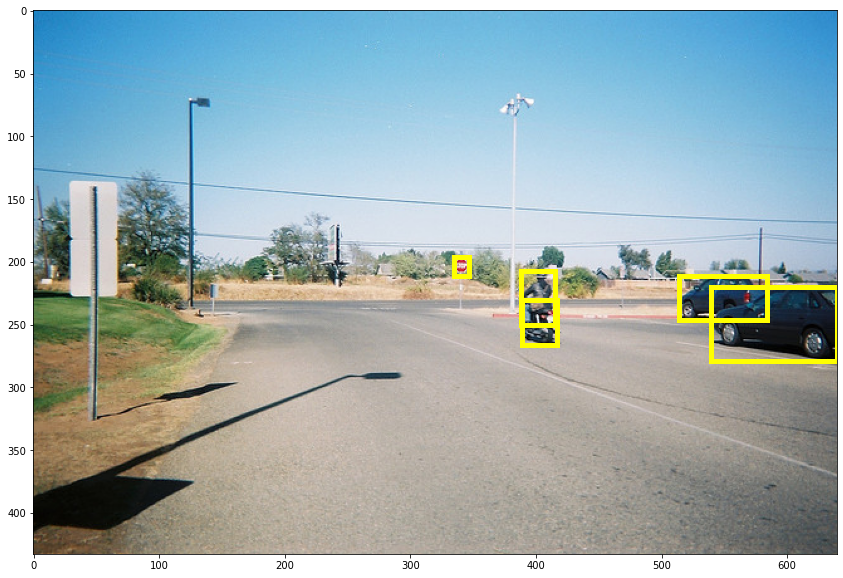

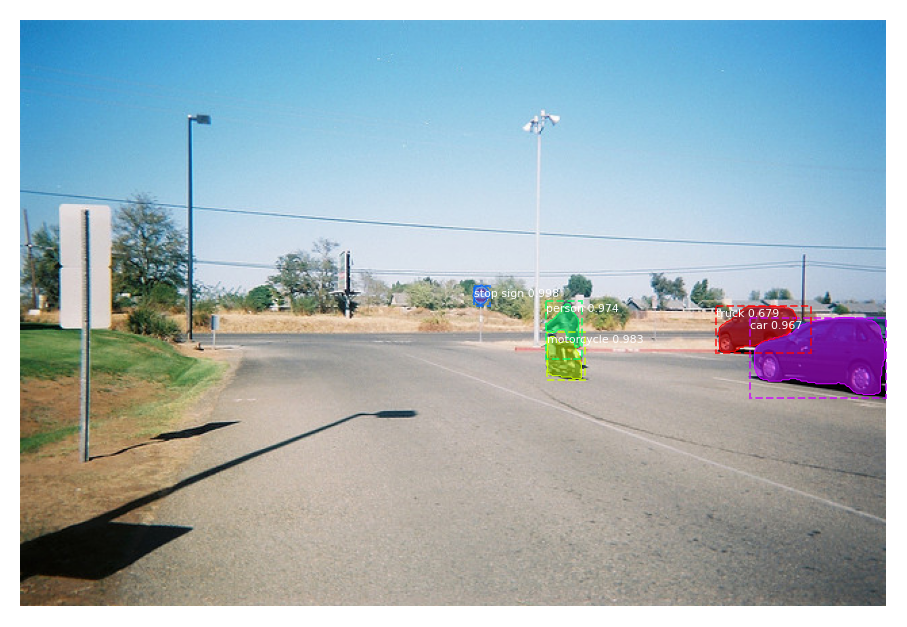

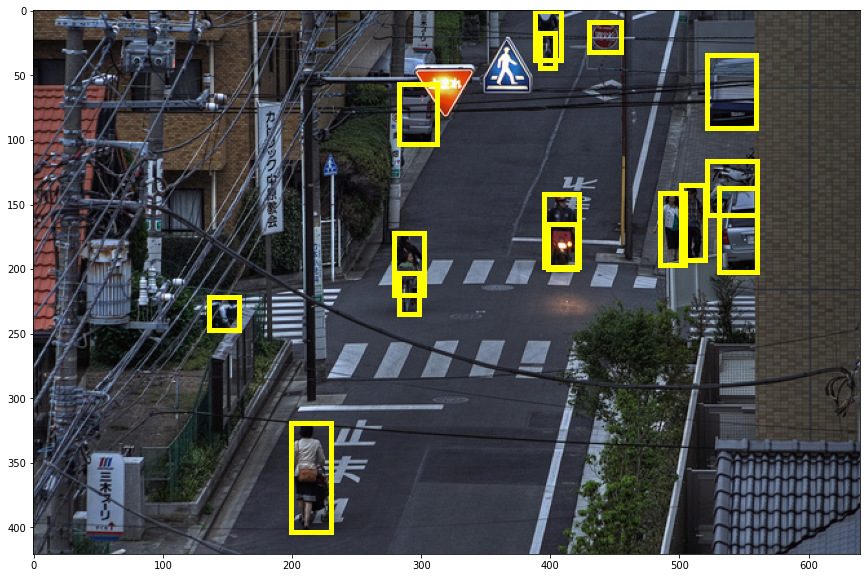

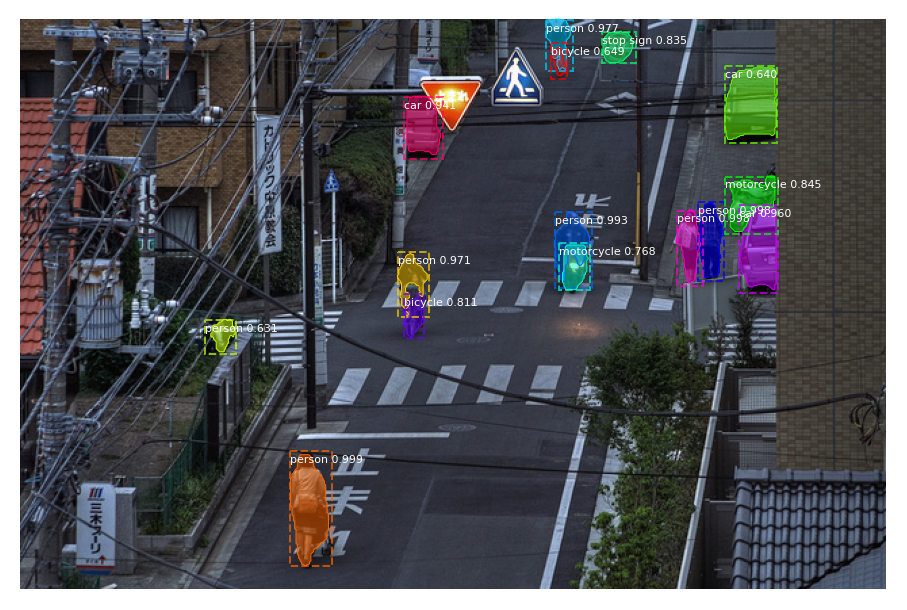

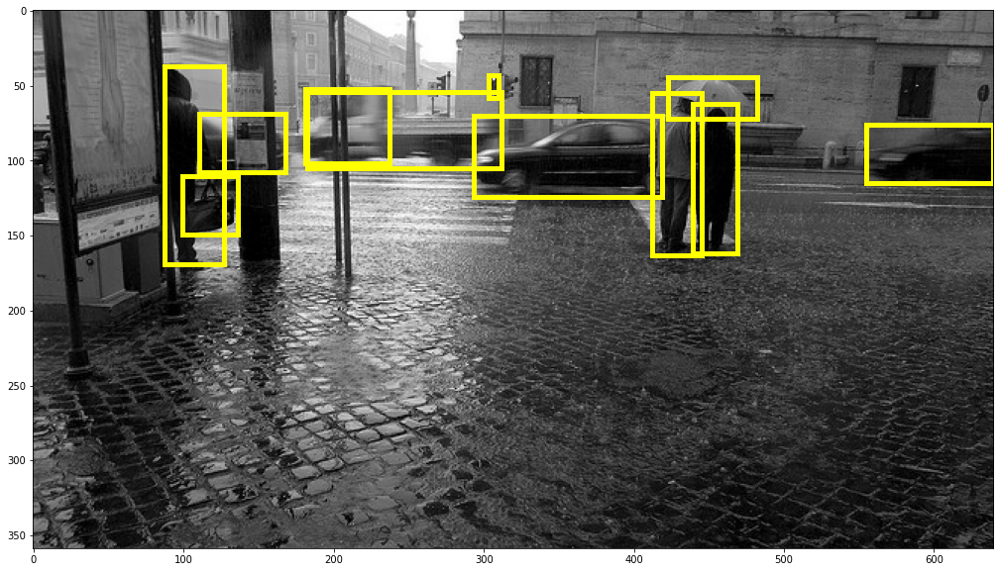

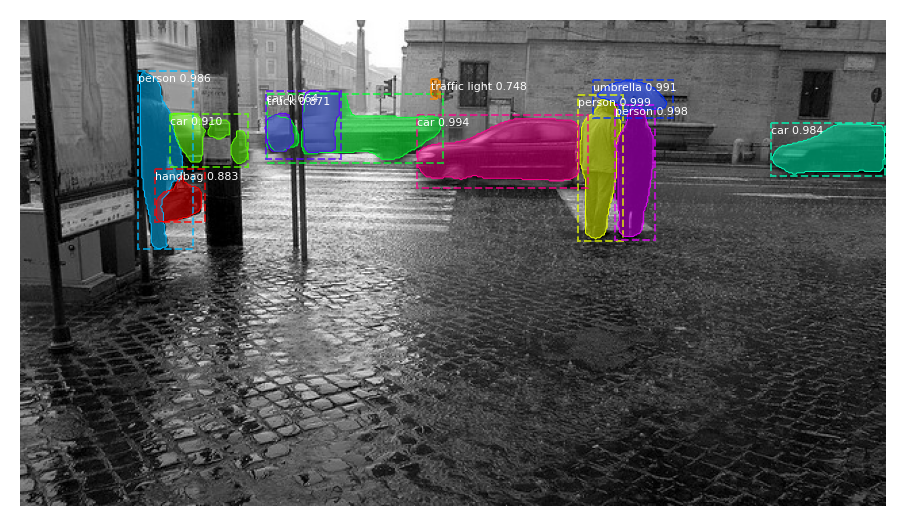

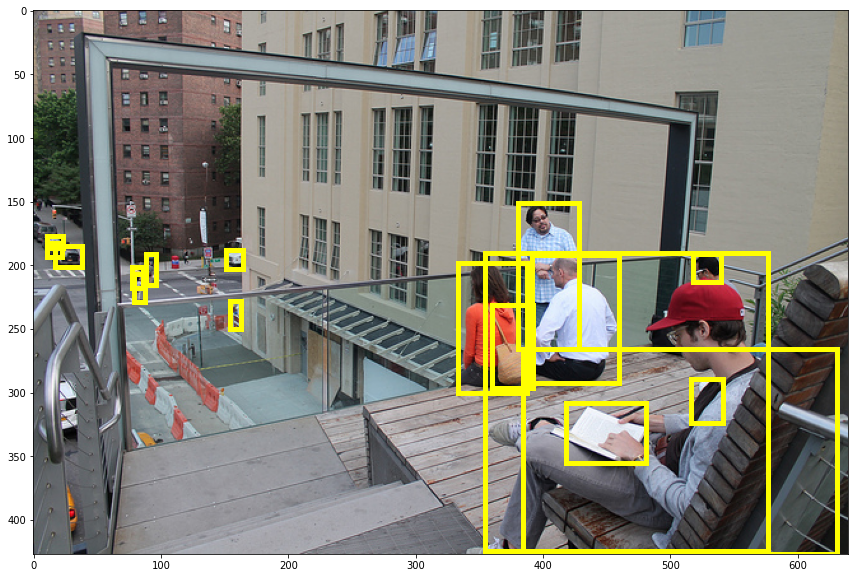

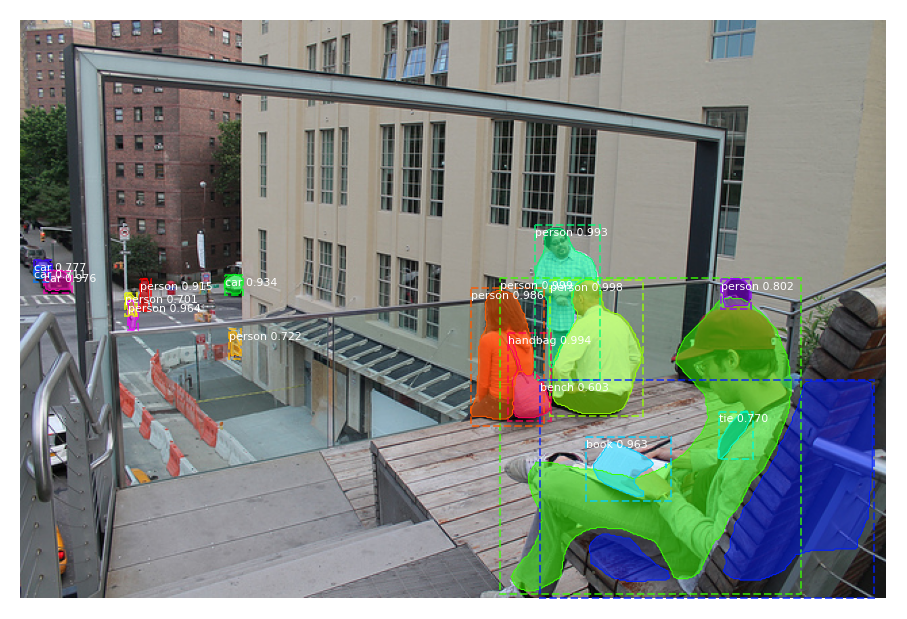

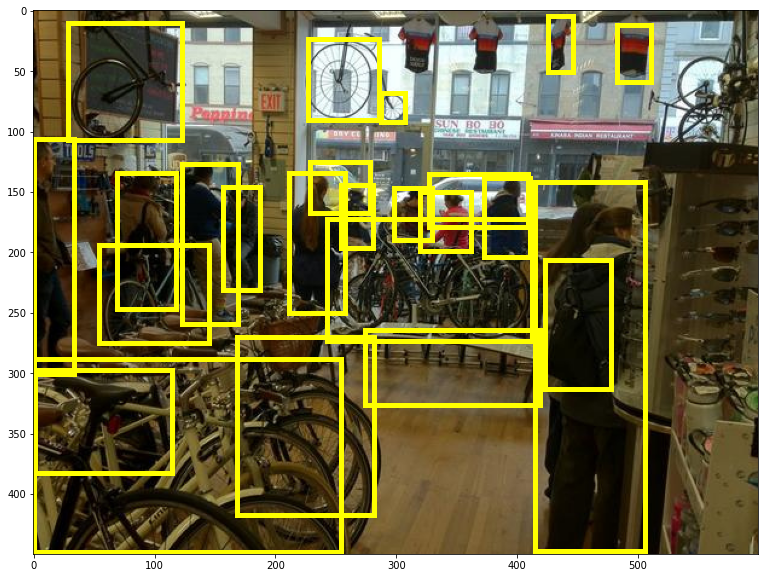

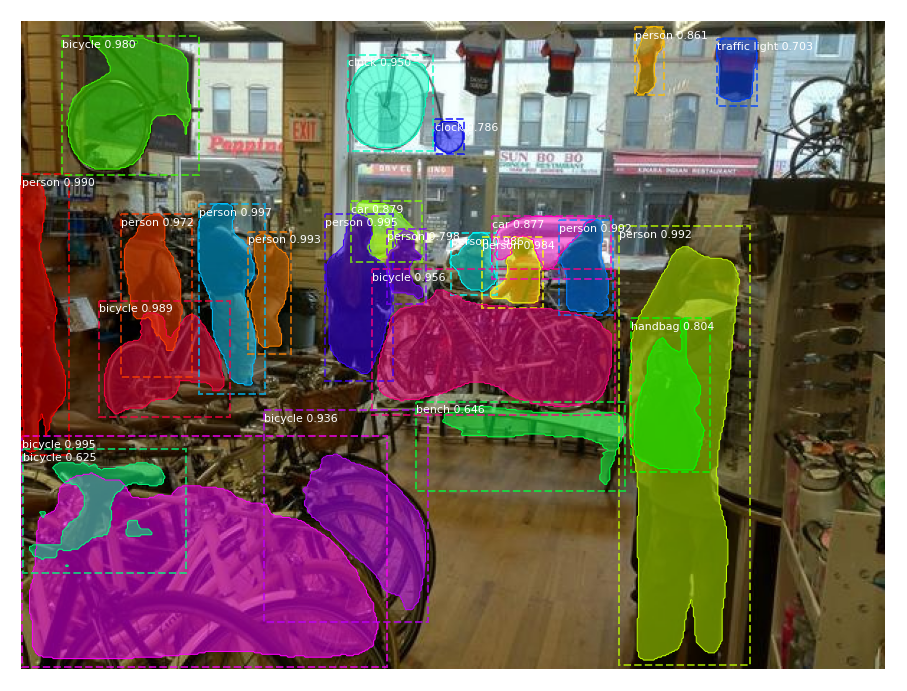

In [27]:
from mrcnn.visualize import display_instances
for i in range(0,5):
    img = io.imread(images[i]['coco_url'])
    image=img_to_array(img)
    results=model.detect([image], verbose=0)
    draw_image_with_boxes(images[i]['coco_url'], results[0]['rois'])
    r=results[0]
    display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

# Detect Cars in the given image as it is the main application for the project.

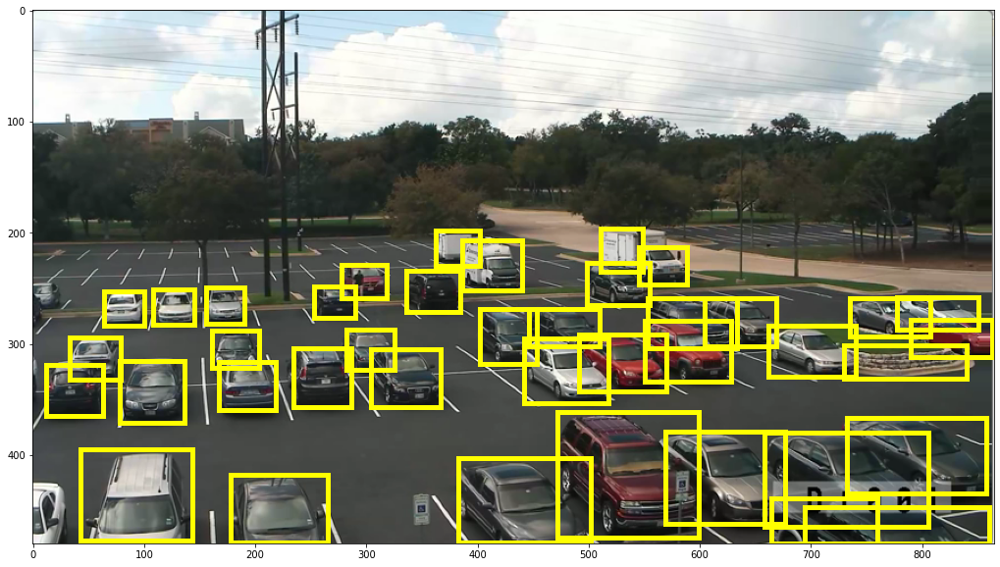

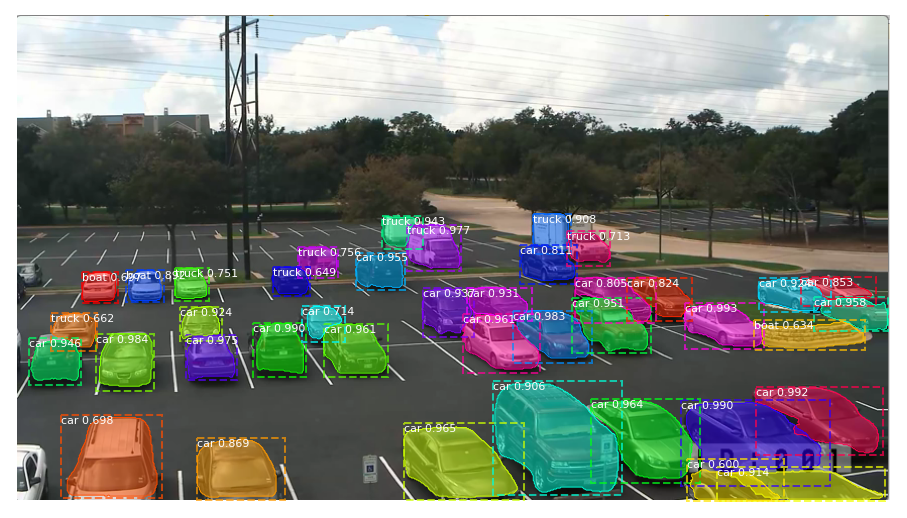

In [28]:
parking_image_path='/content/drive/MyDrive/Parking_Detection_Capstone/parking_lot_1.png'
img = load_img(parking_image_path)
image=img_to_array(img)
results=model.detect([image], verbose=0)
draw_image_with_boxes(parking_image_path, results[0]['rois'])
r=results[0]
display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

In [29]:
classes= r['class_ids']
print("Total Objects found", len(classes))
for i in range(len(classes)):
    print(class_names[classes[i]])

Total Objects found 40
car
car
car
car
car
car
truck
car
car
car
car
car
car
car
car
car
truck
car
car
car
car
car
truck
car
boat
car
car
car
car
car
truck
truck
car
truck
car
boat
truck
truck
boat
car


# Next Steps for Final Phase
1. Detect Empty Parking Spaces using ROI
2. Feed a real time parking video for object detection using OpenCV
3. Use a messaging API service to send a message when an empty space in the lot is available [Optional].